In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import style
import warnings
warnings.filterwarnings('ignore')
from scipy import stats     
import time
import statsmodels.api as sm
import pickle
import matplotlib

In [2]:
df = pd.read_csv('avocado.csv')

## Checking how does the data looks like

In [3]:
df.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


- Renaming the name of some  columns because these names are not telling anything specific about columns.

### Renaiming the columns

In [4]:
df.rename({'Unnamed: 0': "Week_No",'4046' : 'PLU_4046' , '4225': "PLU_4225" , '4770': "PLU_4770"},inplace=True,axis=1)

In [5]:
df.head()

,Week_No,Date,AveragePrice,Total Volume,PLU_4046,PLU_4225,PLU_4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


- Sucessfully rename the columns

## Checking how big data set is

In [6]:
df.shape

(18249, 14)

### Saperating month from Date column  

In [7]:
df['Month']=pd.DatetimeIndex(df['Date']).month

In [8]:
df.drop('Date',axis=1,inplace=True)

## Checking the information and data types of columns

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Week_No       18249 non-null  int64  
 1   AveragePrice  18249 non-null  float64
 2   Total Volume  18249 non-null  float64
 3   PLU_4046      18249 non-null  float64
 4   PLU_4225      18249 non-null  float64
 5   PLU_4770      18249 non-null  float64
 6   Total Bags    18249 non-null  float64
 7   Small Bags    18249 non-null  float64
 8   Large Bags    18249 non-null  float64
 9   XLarge Bags   18249 non-null  float64
 10  type          18249 non-null  object 
 11  year          18249 non-null  int64  
 12  region        18249 non-null  object 
 13  Month         18249 non-null  int64  
dtypes: float64(9), int64(3), object(2)
memory usage: 1.9+ MB


####  Observations

- There is no null value present in any if the column
- Data type od Date column should be date time but here it is object type so we have to covert it into datetime.
- Dataset consumes 1.9 mb

## Checking for missing values

In [10]:
df.isnull().sum()

Week_No         0
AveragePrice    0
Total Volume    0
PLU_4046        0
PLU_4225        0
PLU_4770        0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
type            0
year            0
region          0
Month           0
dtype: int64

 - There is no missing values in dataset.

##  Checking how does the data looks mathematically.

In [11]:
df.describe()

,Week_No,AveragePrice,Total Volume,PLU_4046,PLU_4225,PLU_4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Month
count,18249.000000,18249.000000,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,18249.000000,18249.000000,18249.000000
mean,24.232232,1.405978,8.506440e+05,2.930084e+05,2.951546e+05,2.283974e+04,2.396392e+05,1.821947e+05,5.433809e+04,3106.426507,2016.147899,6.177215
std,15.481045,0.402677,3.453545e+06,1.264989e+06,1.204120e+06,1.074641e+05,9.862424e+05,7.461785e+05,2.439660e+05,17692.894652,0.939938,3.534130
min,0.000000,0.440000,8.456000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,2015.000000,1.000000
25%,10.000000,1.100000,1.083858e+04,8.540700e+02,3.008780e+03,0.000000e+00,5.088640e+03,2.849420e+03,1.274700e+02,0.000000,2015.000000,3.000000
50%,24.000000,1.370000,1.073768e+05,8.645300e+03,2.906102e+04,1.849900e+02,3.974383e+04,2.636282e+04,2.647710e+03,0.000000,2016.000000,6.000000
75%,38.000000,1.660000,4.329623e+05,1.110202e+05,1.502069e+05,6.243420e+03,1.107834e+05,8.333767e+04,2.202925e+04,132.500000,2017.000000,9.000000
max,52.000000,3.250000,6.250565e+07,2.274362e+07,2.047057e+07,2.546439e+06,1.937313e+07,1.338459e+07,5.719097e+06,551693.650000,2018.000000,12.000000


## Checking for duplicate values

In [12]:
df.duplicated().sum()

0

## Checking for the correlation

In [13]:
df.corr()['AveragePrice']

Week_No        -0.133008
AveragePrice    1.000000
Total Volume   -0.192752
PLU_4046       -0.208317
PLU_4225       -0.172928
PLU_4770       -0.179446
Total Bags     -0.177088
Small Bags     -0.174730
Large Bags     -0.172940
XLarge Bags    -0.117592
year            0.093197
Month           0.162409
Name: AveragePrice, dtype: float64

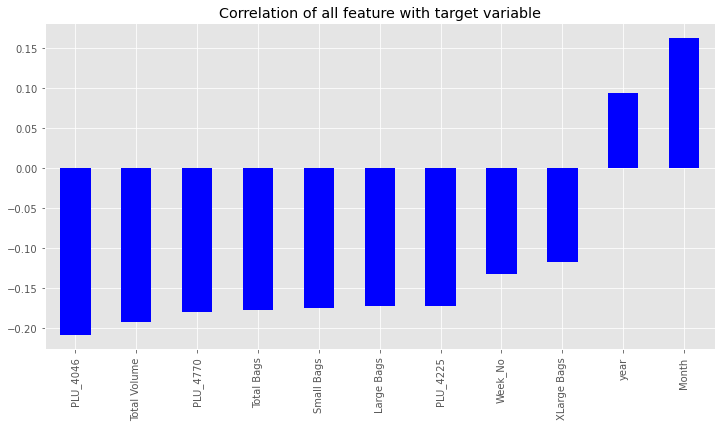

In [14]:
plt.figure(figsize=(12,6))
plt.style.use('ggplot')
df.corr()['AveragePrice'].sort_values().drop('AveragePrice').plot(kind='bar',color='b')
plt.title('Correlation of all feature with target variable')
plt.show()

<AxesSubplot:>

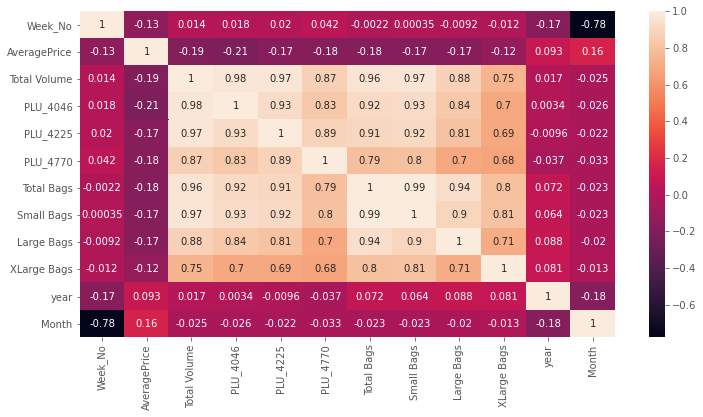

In [15]:
plt.figure(figsize=(12,6))
sns.heatmap(df.corr(),annot=True)

### Observations

- Small Bags and Large bags are equally correlated with the target column hence we can drop one of them.
- Total Bags and PLU_4770 are equally correlated with the target column hence we can drop one of them.

In [16]:
df.head()

,Week_No,AveragePrice,Total Volume,PLU_4046,PLU_4225,PLU_4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month
0,0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12
1,1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12
2,2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,12
3,3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,12
4,4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,11


# Exploratory Data Analysis

### Univariate Analysis

In [17]:
# type column
df['type'].value_counts()

conventional    9126
organic         9123
Name: type, dtype: int64

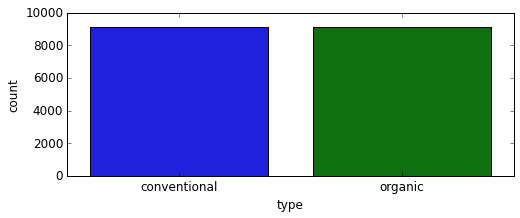

In [18]:
plt.figure(figsize=(8,3))
plt.style.use('classic')
sns.countplot(df.type)
plt.show()

- Both the type of avacodo (conventional & organic) are of same count which means people buys both the type of avacodo in same amount.

In [19]:
# region column
df['region'].nunique()

54

- There are 54 unique region in our data set

In [20]:
df['region'].value_counts()

RaleighGreensboro      338
Orlando                338
SouthCarolina          338
Southeast              338
HarrisburgScranton     338
Nashville              338
DallasFtWorth          338
HartfordSpringfield    338
Syracuse               338
SouthCentral           338
Detroit                338
PhoenixTucson          338
CincinnatiDayton       338
Northeast              338
Roanoke                338
Denver                 338
Charlotte              338
TotalUS                338
NewOrleansMobile       338
Indianapolis           338
Portland               338
SanDiego               338
SanFrancisco           338
Houston                338
Chicago                338
GreatLakes             338
Boston                 338
West                   338
StLouis                338
Jacksonville           338
Seattle                338
Sacramento             338
Columbus               338
Boise                  338
LosAngeles             338
Atlanta                338
NewYork                338
R

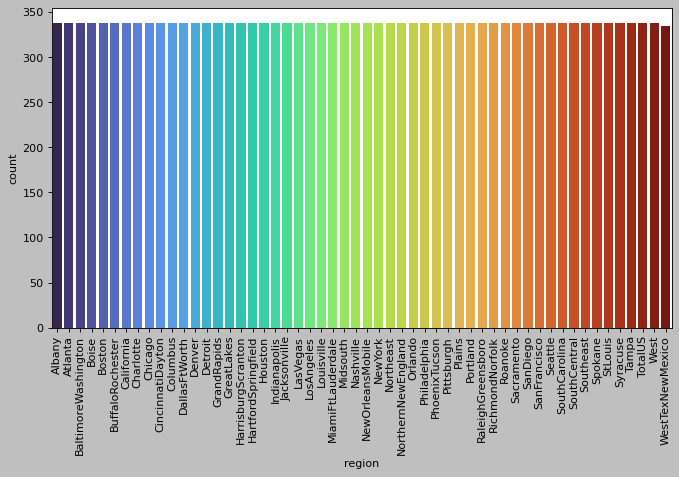

In [21]:
plt.figure(figsize=(10,5))
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
sns.countplot(df.region,palette='turbo')
plt.xticks(rotation=90)
plt.show()

- From the above observations we can see that all the 54 unique region have 338 values &  WestTexNewMexico region have 335 values.

In [22]:
# year column
df['year'].value_counts()

2017    5722
2016    5616
2015    5615
2018    1296
Name: year, dtype: int64

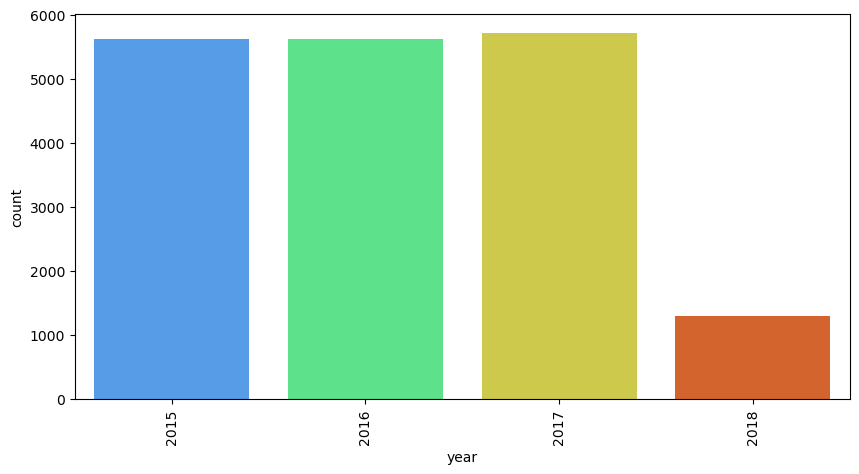

In [23]:
plt.figure(figsize=(10,5))
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
sns.countplot(df['year'],palette='turbo')
plt.xticks(rotation=90)
plt.show()

- It is clear from the above plot that sale of avacado is maximum in year 2017 & minimum in 2018
- In 2015 sale of avacado is 5615
- In 2016 sale of avacado is 5616
- In 2017 sale of avacado is 5722
- In 2018 sale of avacado is 1296


In [24]:
# Average price column

In [25]:
df['AveragePrice'].nunique()

259

- There are 259 unique values in averageprice column

In [26]:
df['AveragePrice'].max(),df['AveragePrice'].min()

(3.25, 0.44)

- The minimum average price of single avacodo is 0.44 & The maximum price of single avacodo is 3.25

In [27]:
# Total Volume column
df['Total Volume'].max(),df['Total Volume'].min()

(62505646.52, 84.56)

- The maximum avacado sold in a week is 62505646.52 & The minimum avacado sold in a week is 84.56

### Bivariate Analysis

In [28]:
df.groupby('year')['AveragePrice'].max()

year
2015    2.79
2016    3.25
2017    3.17
2018    2.30
Name: AveragePrice, dtype: float64

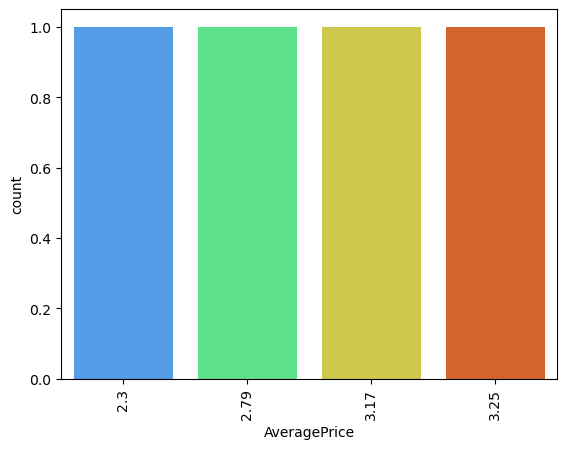

In [29]:
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
sns.countplot(df.groupby('year')['AveragePrice'].max(),palette='turbo')
plt.xticks(rotation=90)
plt.show()

- These are the maximum average price per year.In year 2016 the maximum price is 3.25 per avacado.

In [30]:
df.groupby('year')['AveragePrice'].min()

year
2015    0.49
2016    0.51
2017    0.44
2018    0.56
Name: AveragePrice, dtype: float64

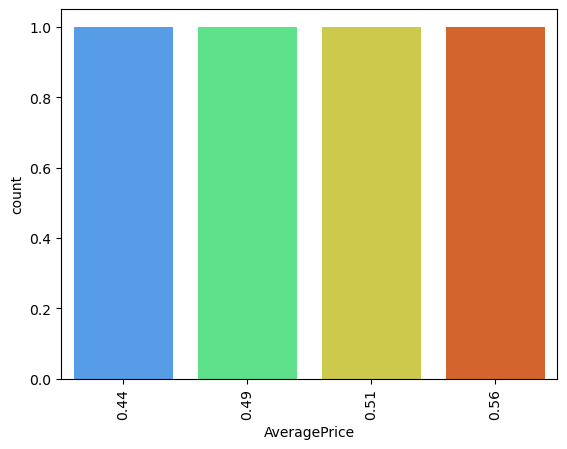

In [31]:
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
sns.countplot(df.groupby('year')['AveragePrice'].min(),palette='turbo')
plt.xticks(rotation=90)
plt.show()

- These are the minimum average price per year.In year 2015 the maximum price is 0.44 per avacado.

In [32]:
df.groupby('Month')['AveragePrice'].max() 

Month
1     2.70
2     2.59
3     3.05
4     3.17
5     2.73
6     2.77
7     2.75
8     3.04
9     2.97
10    3.25
11    3.12
12    2.67
Name: AveragePrice, dtype: float64

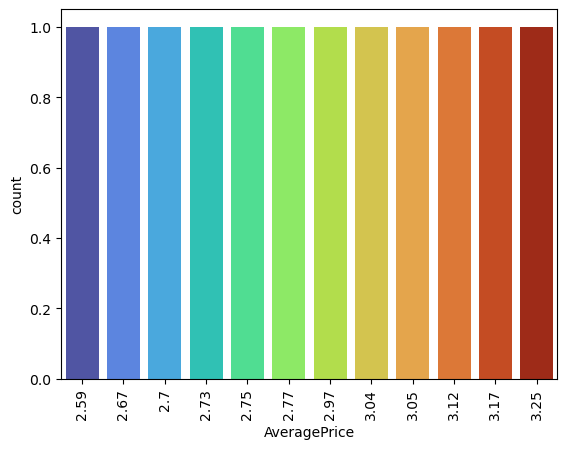

In [33]:
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
sns.countplot(df.groupby('Month')['AveragePrice'].max() ,palette='turbo')
plt.xticks(rotation=90)
plt.show()

- These are the average maximum price of a single avacado in each month.

In [34]:
df.groupby('Month')['AveragePrice'].min() 

Month
1     0.51
2     0.46
3     0.44
4     0.51
5     0.55
6     0.52
7     0.56
8     0.58
9     0.58
10    0.65
11    0.60
12    0.49
Name: AveragePrice, dtype: float64

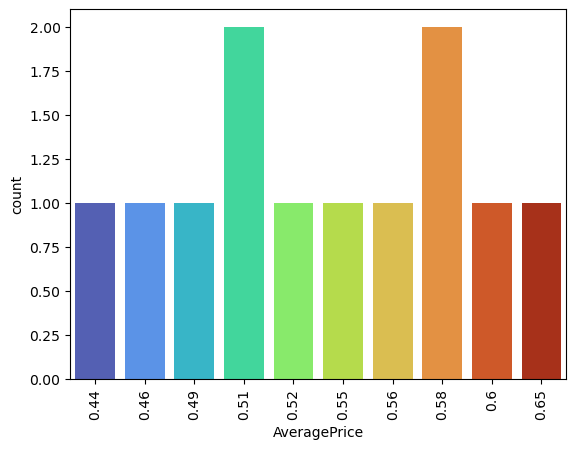

In [35]:
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
sns.countplot(df.groupby('Month')['AveragePrice'].min() ,palette='turbo')
plt.xticks(rotation=90)
plt.show()

- These are the average minimum price of a single avacado in each month.

In [36]:
# pd.set_option.display.max_columns
pd.set_option("display.max_columns", None)

In [37]:
df.pivot_table(index='year',columns='type')

AveragePrice               Large Bags                     Month  \
type conventional   organic   conventional      organic conventional   
year                                                                   
2015     1.077963  1.673324   43863.678276  3169.644418     6.519231   
2016     1.105595  1.571684  111694.138868  8187.037080     6.442308   
2017     1.294888  1.735521  129757.346080  9780.949528     6.528302   
2018     1.127886  1.567176  181683.772731  9032.257948     2.000000   

                     PLU_4046                    PLU_4225                \
type   organic   conventional      organic   conventional       organic   
year                                                                      
2015  6.517278  599719.474566  9062.236110  613450.264387  13710.614079   
2016  6.442308  536580.093533  6554.839623  579296.707443  16404.249822   
2017  6.528671  570801.128225  6435.420469  524296.098333  15454.295839   
2018  2.000000  703777.625031  6870.112778  610963.595031  18293.618364   

          PLU_4770                 Small Bags                   Total Bags  \
type  conventional     organic   conventional       organic   conventional   
year                                                                         
2015  50540.495110  304.483178  220615.584601   5412.947528  266417.698875   
2016  56540.788946  396.477796  379069.014875  14981.640260  497899.295068   
2017  31727.793463  144.252759  400361.766335  26964.038329  538501.945542   
2018  35314.986204   74.820571  516100.893009  40598.748580  708903.776960   

                    Total Volume                    Week_No             \
type       organic  conventional       organic conventional    organic   
year                                                                     
2015   8582.593014  1.530128e+06  31659.931012         25.5  25.490916   
2016  23168.677340  1.670317e+06  46524.244580         25.5  25.500000   
2017  36746.915804  1.665327e+06  58790.176864         26.0  25.982168   
2018  49639.351898  2.058960e+06  74895.480139          5.5   5.500000   

       XLarge Bags            
type  conventional   organic  
year                          
2015   1938.435997  0.000000  
2016   7136.141325  0.000000  
2017   8382.829633  1.927948  
2018  11119.111219  8.345370

### observations
- Here i created pivot table to campare all the feature with respect to conventional & organic type of avacado.
- Here i found that average price of organic avacado in each year is more than conventional type of avacado.
- Total bags for conventional avacado is more than organic avacado.
- Large bags are sold for conventional avacado in year 2015,2016,2017 is 13 time more than organic avacado and 20 time more in year 2018.
- Small bags for conventional avacado is more than organic avacado.
- XLarge bags for conventional avacado is more than organic avacado.
- Total Sale of conventional avacado is more than organic avacado.
- let's visualise it in proper way

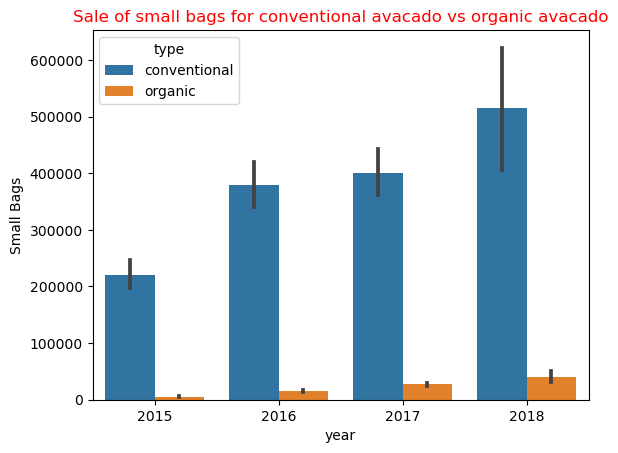

In [38]:
sns.barplot(df['year'],df['Small Bags'],hue=df['type'])
plt.title('Sale of small bags for conventional avacado vs organic avacado',color='r')
plt.show()

### Observations
- Form the above plot we can clearly observed that small bags for conventional avacado are sold more than organic avacado.
- In year 2018 the difference between sale of small bags for conventional avacado & organic avacado is much higher than remaining years.

<AxesSubplot:xlabel='year', ylabel='Large Bags'>

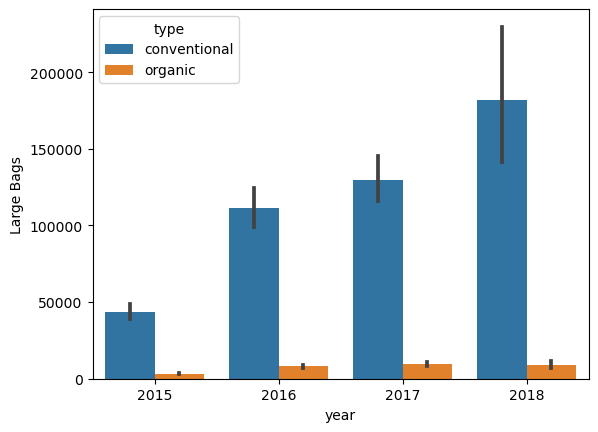

In [39]:
sns.barplot(df['year'],df['Large Bags'],hue=df['type'])

### Observations
- Form the above plot we can clearly observed that Largs bags for conventional avacado are sold more than organic avacado.
- In year 2018 the difference between sale of small bags for conventional avacado & organic avacado is much higher than remaining years.

<AxesSubplot:xlabel='year', ylabel='XLarge Bags'>

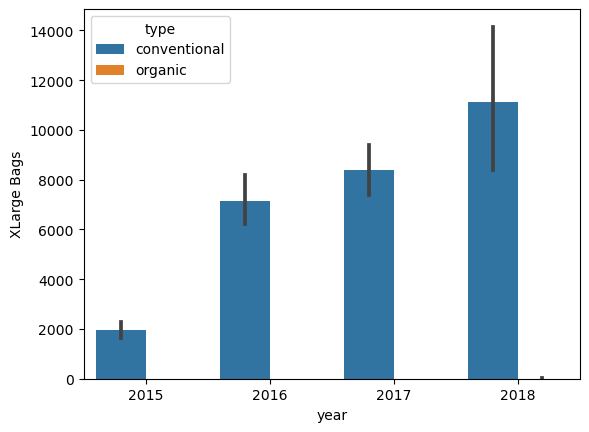

In [40]:
sns.barplot(df['year'],df['XLarge Bags'],hue=df['type'])

### Observations
- Form the above plot we can clearly observed that XLarge bags for conventional avacado are sold more than organic avacado.
- In year 2018 the difference between sale of XLarge bags for conventional avacado & organic avacado is much higher than remaining years.

<AxesSubplot:xlabel='year', ylabel='AveragePrice'>

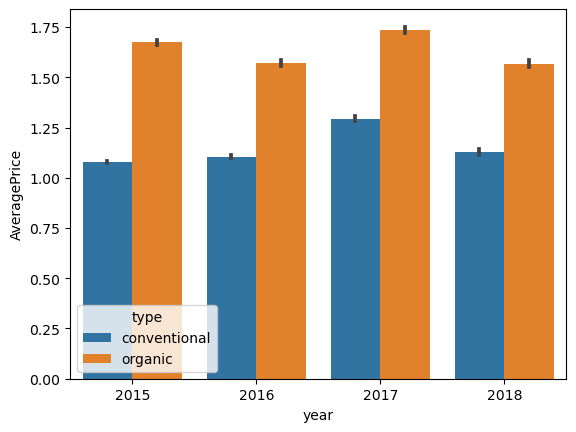

In [41]:
sns.barplot(df['year'],df['AveragePrice'],hue=df['type'])

### Observations
- The price Average price of  <b> Organic </b> avacado is more than <b> Conventional </b>avacado.
- In year 2017 the price for  <b> Organic </b> avacado is maximum.

In [42]:
d=df[df['type']=='conventional']
d.pivot_table(index='year')

,AveragePrice,Large Bags,Month,PLU_4046,PLU_4225,PLU_4770,Small Bags,Total Bags,Total Volume,Week_No,XLarge Bags
year,,,,,,,,,,,
2015,1.077963,43863.678276,6.519231,599719.474566,613450.264387,50540.495110,220615.584601,266417.698875,1.530128e+06,25.5,1938.435997
2016,1.105595,111694.138868,6.442308,536580.093533,579296.707443,56540.788946,379069.014875,497899.295068,1.670317e+06,25.5,7136.141325
2017,1.294888,129757.346080,6.528302,570801.128225,524296.098333,31727.793463,400361.766335,538501.945542,1.665327e+06,26.0,8382.829633
2018,1.127886,181683.772731,2.000000,703777.625031,610963.595031,35314.986204,516100.893009,708903.776960,2.058960e+06,5.5,11119.111219


In [43]:
d=df[df['type']=='organic']
d.pivot_table(index='year')

,AveragePrice,Large Bags,Month,PLU_4046,PLU_4225,PLU_4770,Small Bags,Total Bags,Total Volume,Week_No,XLarge Bags
year,,,,,,,,,,,
2015,1.673324,3169.644418,6.517278,9062.236110,13710.614079,304.483178,5412.947528,8582.593014,31659.931012,25.490916,0.000000
2016,1.571684,8187.037080,6.442308,6554.839623,16404.249822,396.477796,14981.640260,23168.677340,46524.244580,25.500000,0.000000
2017,1.735521,9780.949528,6.528671,6435.420469,15454.295839,144.252759,26964.038329,36746.915804,58790.176864,25.982168,1.927948
2018,1.567176,9032.257948,2.000000,6870.112778,18293.618364,74.820571,40598.748580,49639.351898,74895.480139,5.500000,8.345370


- Here i have created two pivot table 
- In first pivot table there are all the information about the <b>conventional</b> type of avacado.
- And in second pivot table there are all the information about the <b>Organic</b> type of avacado.

<AxesSubplot:xlabel='year', ylabel='Total Volume'>

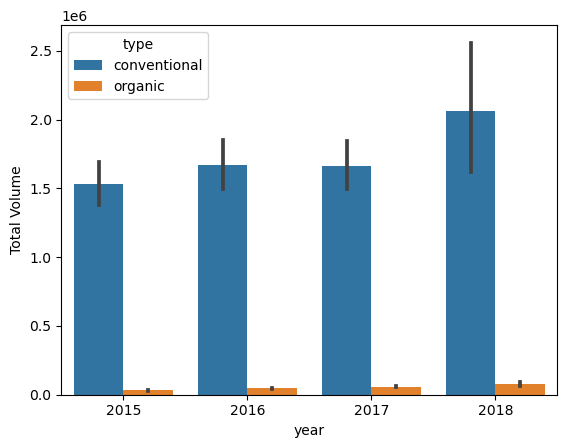

In [44]:
sns.barplot(x=df['year'],y=df['Total Volume'],hue=df['type'])

### Obeservations

- <b> Conventional </b>  avacado are sold more because price of Conventional avacado is less than organic avacado.
- The price of <b>organic</b> avacado is more than convetional avacado hence the sale is less.

<AxesSubplot:xlabel='region'>

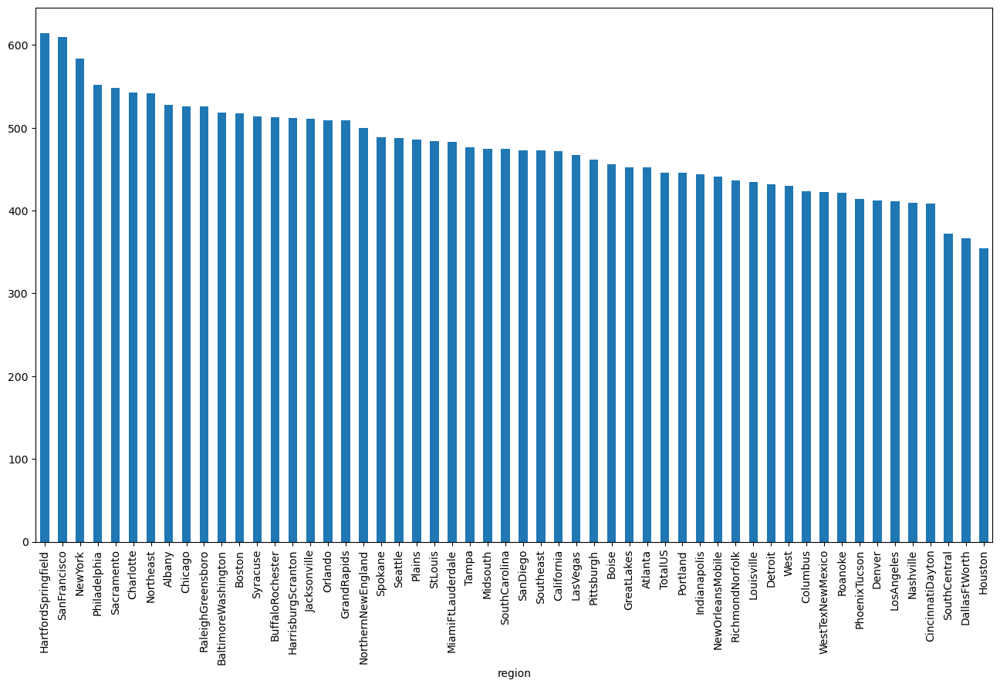

In [45]:
plt.figure(figsize=(16,9))
df.groupby('region')['AveragePrice'].sum().sort_values(ascending=False).plot(kind='bar')

- HartfordSpringfield is the region where maximum avacado were sold and Houston is the region where minimum numbers of avacado were sold.

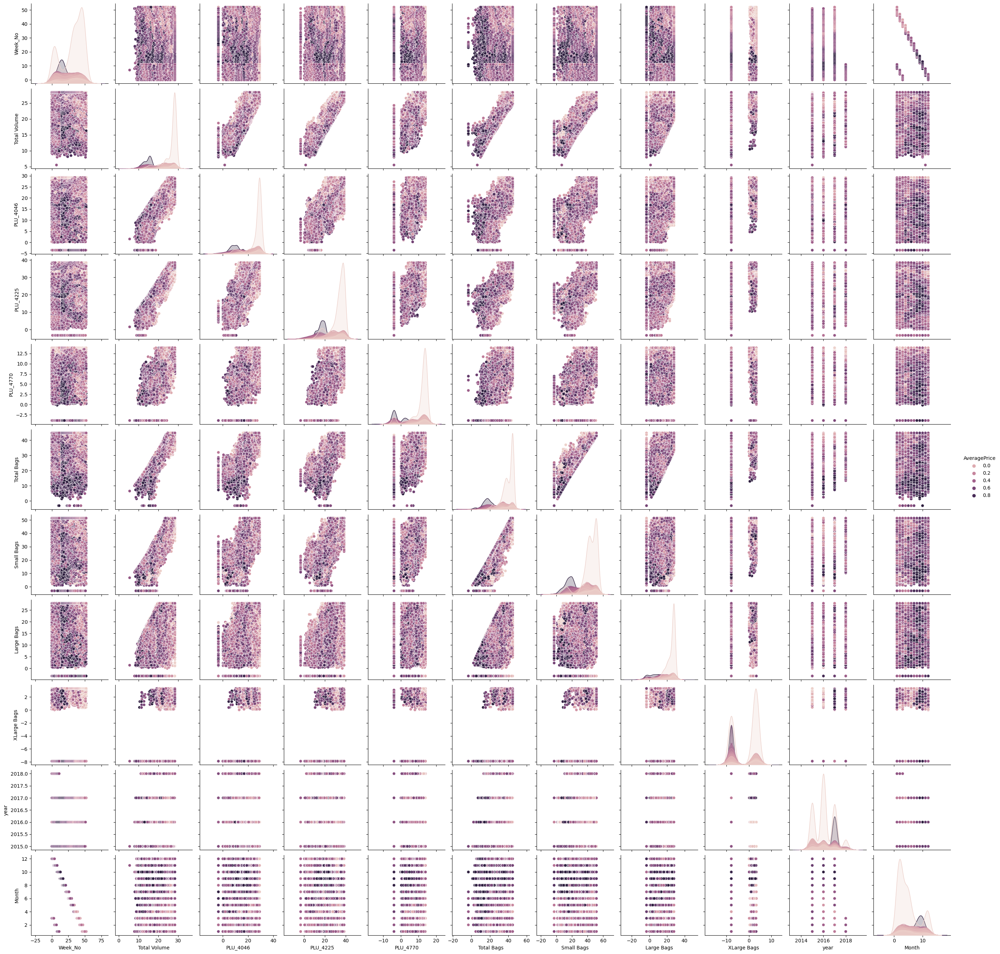

In [124]:
# Pairplot
sns.pairplot(df,hue='AveragePrice')

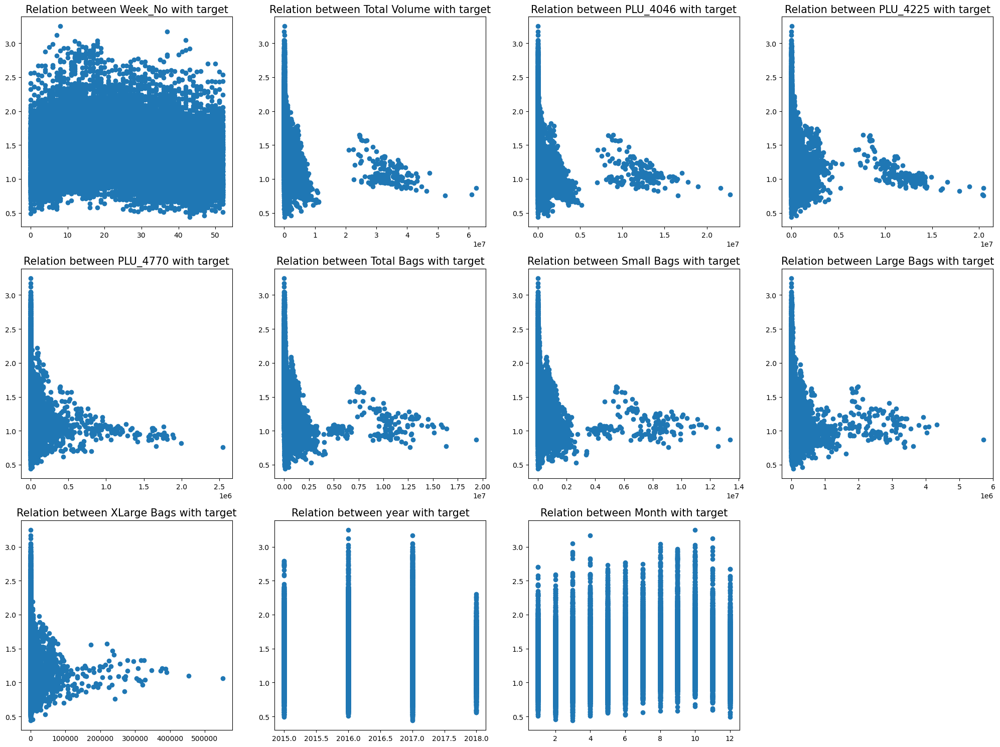

In [47]:
colms=[]
for i in df.drop('AveragePrice',axis=1).columns:
    if df[i].dtype != "O":
        colms.append(i)
plt.figure(figsize=(25,25))
for i ,j in enumerate(colms):
    plt.subplot(4,4,i+1)
    plt.scatter(df[j],df['AveragePrice'])
    plt.xticks(color='k')
    plt.yticks(color='k')
    plt.title(f"Relation between {j} with target",fontsize=15,color='k')
plt.show()   

### Observations
- It seems like none of the columns is showing linear relationshib with the output column.

In [48]:
### Checking for Data Distributions

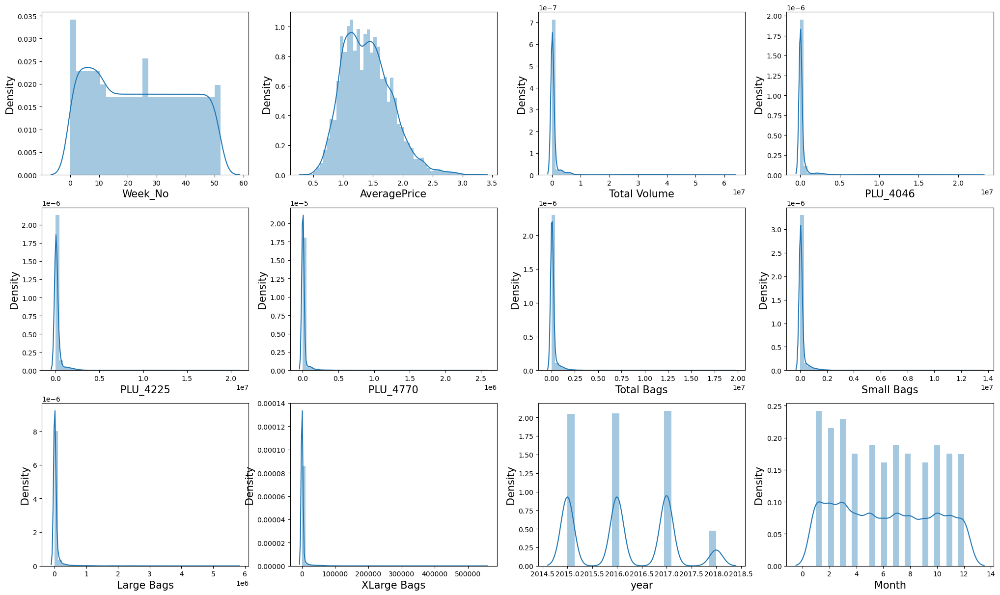

In [49]:
colms=[]
for i in df.columns:
    if df[i].dtype != "O":
        colms.append(i)
plt.figure(figsize=(25,25))
# plt.grid(b=2,axis='y')0
# plt.style.use('seaborn-white')
for i ,j in enumerate(colms):
    plt.subplot(5,4,i+1)
    sns.distplot(df[j])
    plt.xlabel(j,fontsize=15)
    plt.ylabel('Density',fontsize=15,color='k')
#     plt.xticks(color='w',fontsize=10)
#     plt.yticks(color='w',fontsize=10)
plt.show()           

- AveragePrice column is normally distributed.
- Else all the important columns looks right skewed 

# Checking for outliers

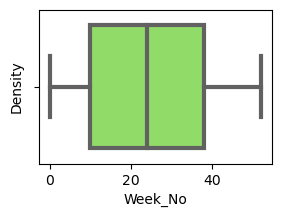

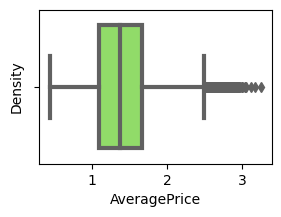

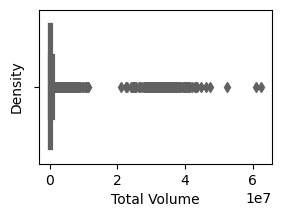

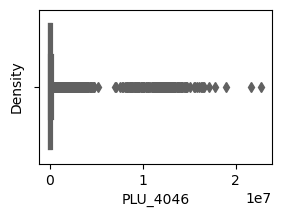

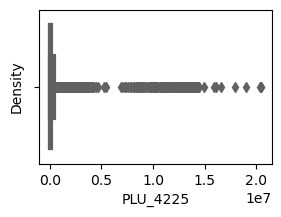

...

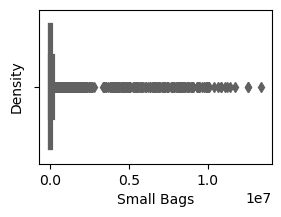

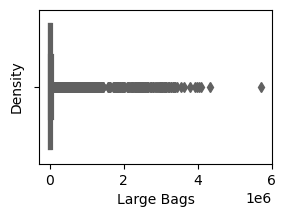

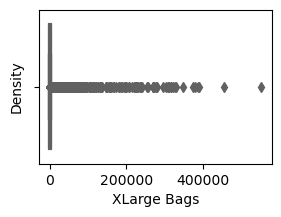

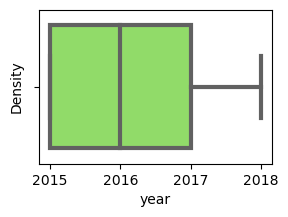

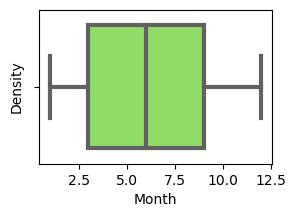

In [50]:
for i ,j in enumerate(colms):
    plt.figure(figsize=(3,2))
    sns.boxplot(df[j],color='#8BEE56',width=0.8,linewidth=3)
    plt.xlabel(j,color='k',)
    plt.ylabel('Density',color='k')
    plt.show()  

- Looks like all the columns has outliers

# Removing Outliers using IQR Method

In [51]:
outliers_columns=[ 'AveragePrice','Total Volume','PLU_4046','PLU_4225','PLU_4770','Total Bags','Small Bags','Large Bags','XLarge Bags']
for i in outliers_columns:
    IQR = df[i].quantile(.75) - df[i].quantile(.25)
    upper =  df[i].quantile(.75) + 1.5 * IQR
    lower =  df[i].quantile(.75) - 1.5 * IQR
    df[i] = np.where(df[i]> upper ,upper , np.where(df[i]<lower , lower ,df[i]))

# Box Plot after removing outliers

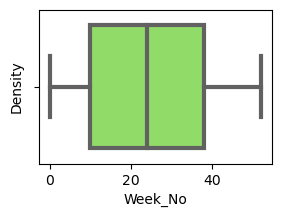

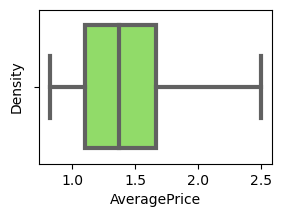

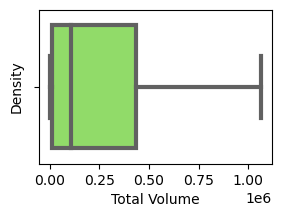

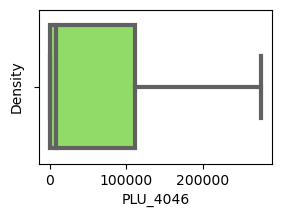

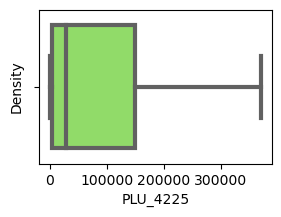

...

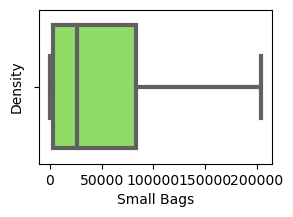

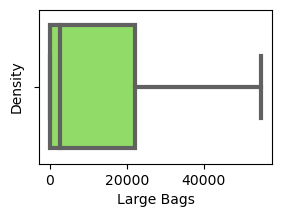

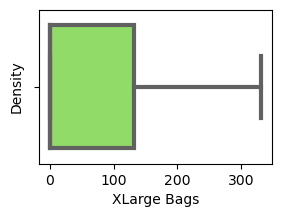

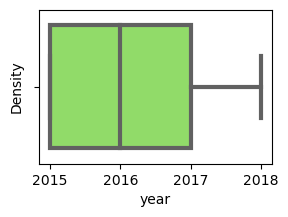

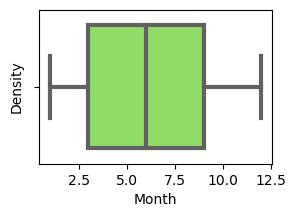

In [52]:
for i ,j in enumerate(colms):
    plt.figure(figsize=(3,2))
    sns.boxplot(df[j],color='#8BEE56',width=0.8,linewidth=3)
    plt.xlabel(j,color='k',)
    plt.ylabel('Density',color='k')
    plt.show()  

- Here we sucessfully removed Outliers

# Checking for skewness

In [53]:
df.skew()

Week_No         0.108334
AveragePrice    0.545081
Total Volume    1.206542
PLU_4046        1.251184
PLU_4225        1.219271
PLU_4770        1.212184
Total Bags      1.158550
Small Bags      1.186103
Large Bags      1.215301
XLarge Bags     1.175351
year            0.215339
Month           0.106617
dtype: float64

AveragePrice,Total Volume,PLU_4046,PLU_4225,PLU_4770,Total Bags,Small Bags,Large Bags,XLarge Bags these columns have skewness hence we have to renove skewness.

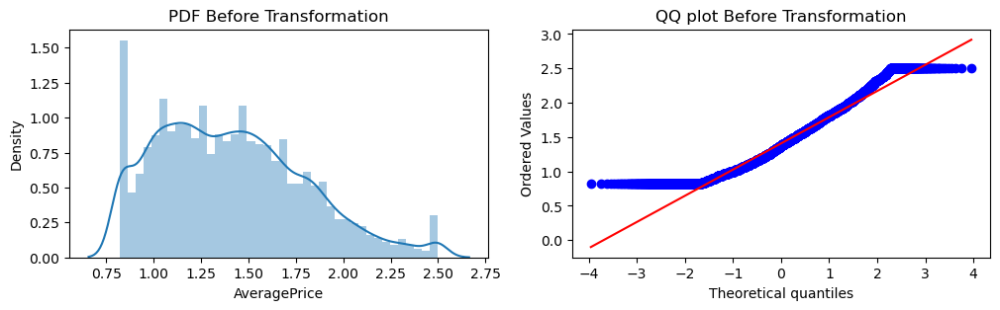

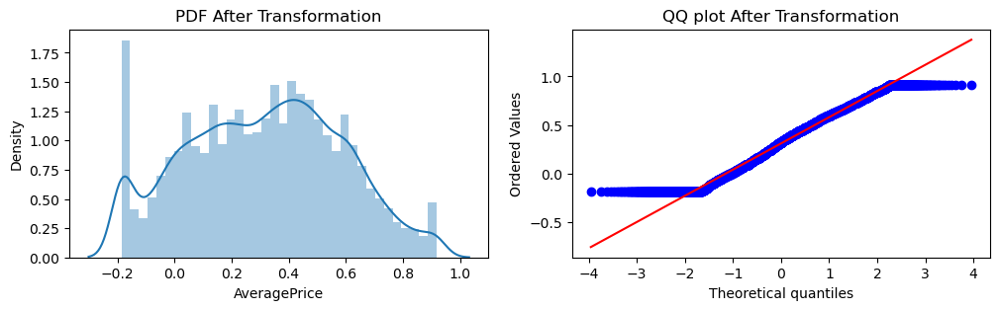

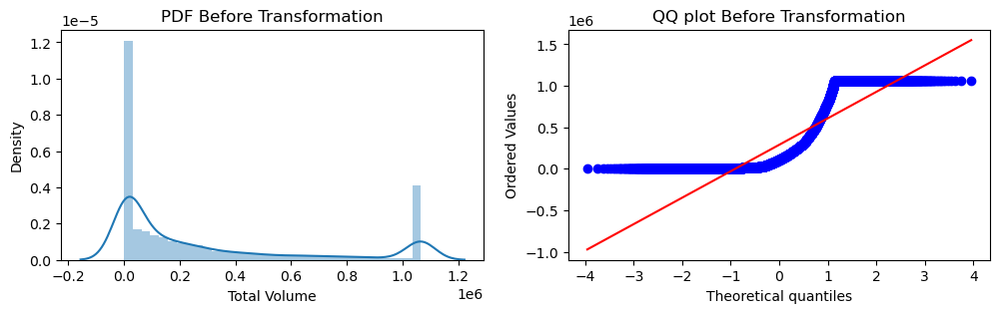

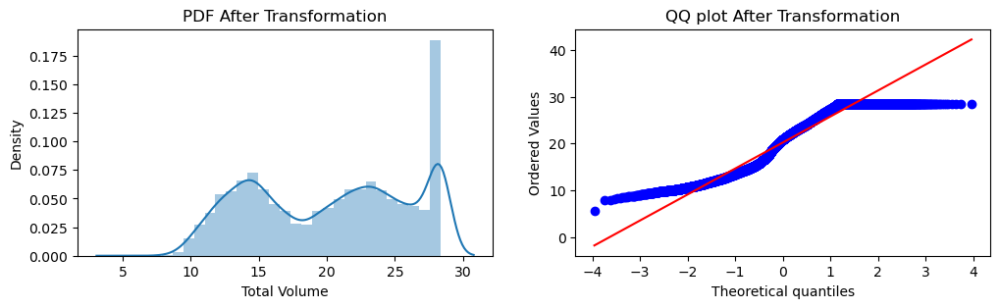

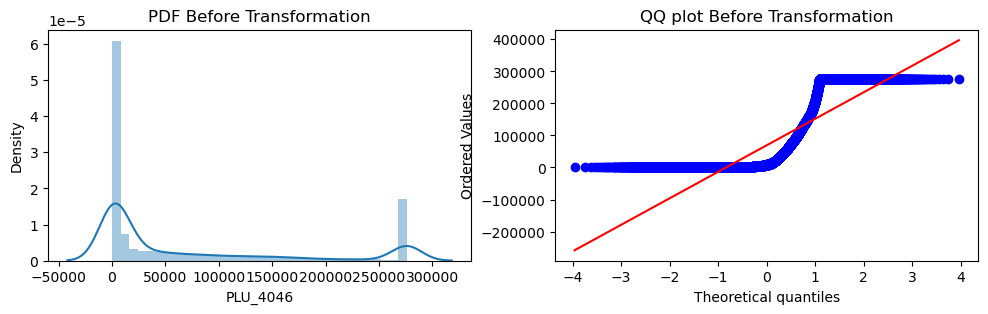

...

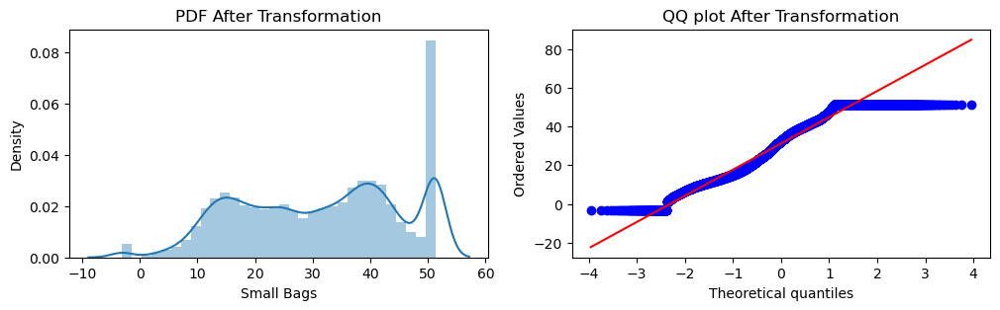

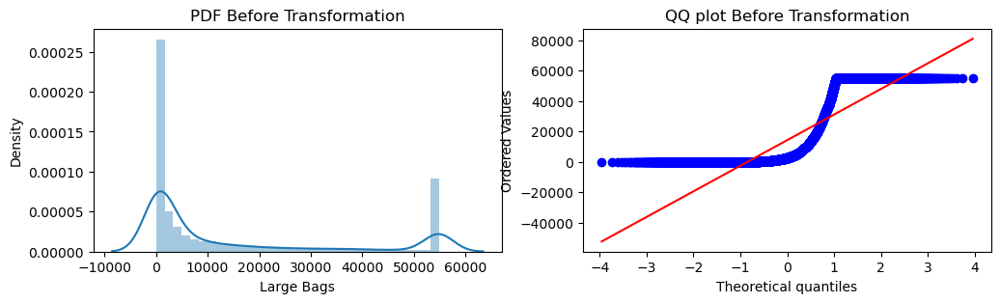

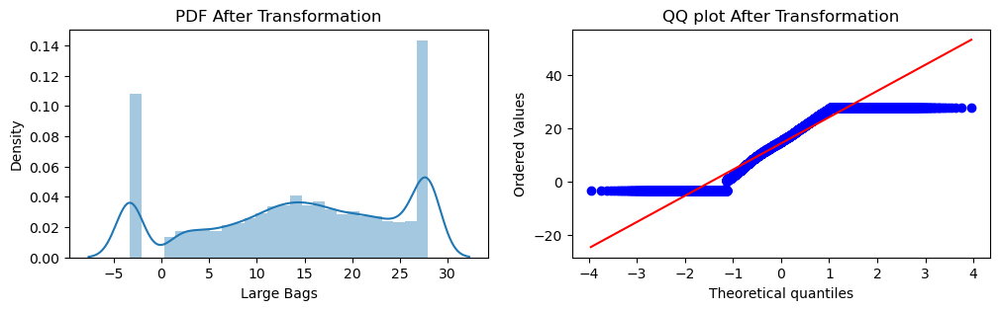

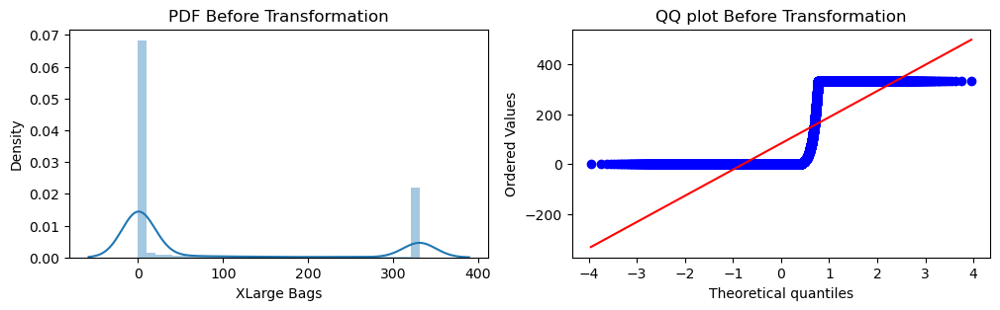

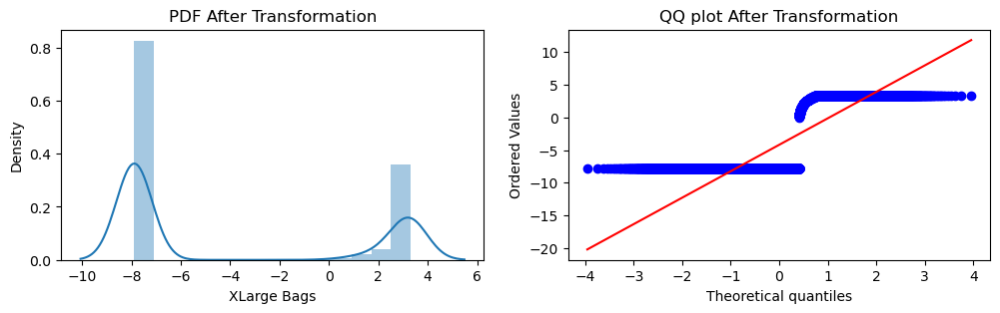

In [54]:
# performing Boxcox transformation on right skewed columns
for i, j in enumerate(outliers_columns):
    plt.figure(figsize=(12,3))
    plt.subplot(2,5,i+1)
    plt.subplot(1,2,1)
    sns.distplot(df[j])
    plt.title('PDF Before Transformation')
    plt.subplot(1,2,2)
    stats.probplot(df[j], dist="norm", plot=plt)
    plt.title('QQ plot Before Transformation')
    df[j],params = stats.boxcox(df[j]+0.01)
    plt.figure(figsize=(12,3))
    plt.subplot(1,2,1)
    sns.distplot(df[j])
    plt.title('PDF After Transformation')
    plt.subplot(1,2,2)
    stats.probplot(df[j], dist="norm", plot=plt)
    plt.title('QQ plot After Transformation')
    plt.show()

In [55]:
df.skew()

Week_No         0.108334
AveragePrice    0.000553
Total Volume   -0.084657
PLU_4046       -0.130675
PLU_4225       -0.136723
PLU_4770       -0.215933
Total Bags     -0.130224
Small Bags     -0.173121
Large Bags     -0.326087
XLarge Bags     0.690533
year            0.215339
Month           0.106617
dtype: float64

here we can clearly see that skewness from the data has been sucessfully removed

In [56]:
df.head()

,Week_No,AveragePrice,Total Volume,PLU_4046,PLU_4225,PLU_4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month
0,0,0.292320,19.365417,10.854923,27.255911,4.462905,22.068562,25.152672,6.525171,-7.881551,conventional,2015,Albany,12
1,1,0.307098,18.927224,9.888009,26.267783,4.717145,22.501622,25.689411,6.613953,-7.881551,conventional,2015,Albany,12
2,2,-0.061891,21.124652,10.251442,30.951290,5.824614,21.753715,24.753683,6.727303,-7.881551,conventional,2015,Albany,12
3,3,0.086147,19.950620,11.058736,28.692818,5.011479,20.186624,22.776974,7.263081,-7.881551,conventional,2015,Albany,12
4,4,0.254377,18.727662,10.633915,26.179273,5.070123,20.468323,23.069022,8.109045,-7.881551,conventional,2015,Albany,11


# For Regression Problem

# splitting Data into input label and output label

In [57]:
X = df.drop(columns=['Week_No','AveragePrice'])
y = df['AveragePrice']

In [58]:
X.shape

(18249, 12)

In [59]:
y.shape

(18249,)

In [60]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, accuracy_score, mean_absolute_error
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score,GridSearchCV,train_test_split,RandomizedSearchCV
from sklearn.linear_model import LinearRegression,Ridge,Lasso,ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor,AdaBoostRegressor,ExtraTreesRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.ensemble import VotingRegressor,StackingRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
from sklearn.feature_selection import SelectKBest,chi2


# Lable Encoding for Region column

In [61]:
le=LabelEncoder()
X['region']=le.fit_transform(X['region'])

In [62]:
X

,Total Volume,PLU_4046,PLU_4225,PLU_4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month
0,19.365417,10.854923,27.255911,4.462905,22.068562,25.152672,6.525171,-7.881551,conventional,2015,0,12
1,18.927224,9.888009,26.267783,4.717145,22.501622,25.689411,6.613953,-7.881551,conventional,2015,0,12
2,21.124652,10.251442,30.951290,5.824614,21.753715,24.753683,6.727303,-7.881551,conventional,2015,0,12
3,19.950620,11.058736,28.692818,5.011479,20.186624,22.776974,7.263081,-7.881551,conventional,2015,0,12
4,18.727662,10.633915,26.179273,5.070123,20.468323,23.069022,8.109045,-7.881551,conventional,2015,0,11
...,...,...,...,...,...,...,...,...,...,...,...,...
18244,15.871484,12.489874,13.266908,-3.925458,24.276531,27.745219,9.959339,-7.881551,organic,2018,53,2
18245,15.364541,11.178901,15.816355,-3.925458,22.376003,25.381842,9.259228,-7.881551,organic,2018,53,1
18246,15.343232,11.179334,14.719994,8.412596,22.443793,25.653092,5.043317,-7.881551,organic,2018,53,1
18247,15.742285,11.770121,15.350200,8.410551,23.213528,26.605308,5.341817,-7.881551,organic,2018,53,1


In [63]:
X['type']=np.where(X['type']=="conventional",0,1)

# Feature Importance

In [64]:
from sklearn.ensemble import ExtraTreesRegressor
extra=ExtraTreesRegressor()
extra.fit(X,y)

ExtraTreesRegressor()

In [65]:
print(extra.feature_importances_)

[0.03756032 0.06864577 0.06399323 0.03750492 0.04125319 0.03271976
 0.07350758 0.01234904 0.39849532 0.08139746 0.05595023 0.09662318]


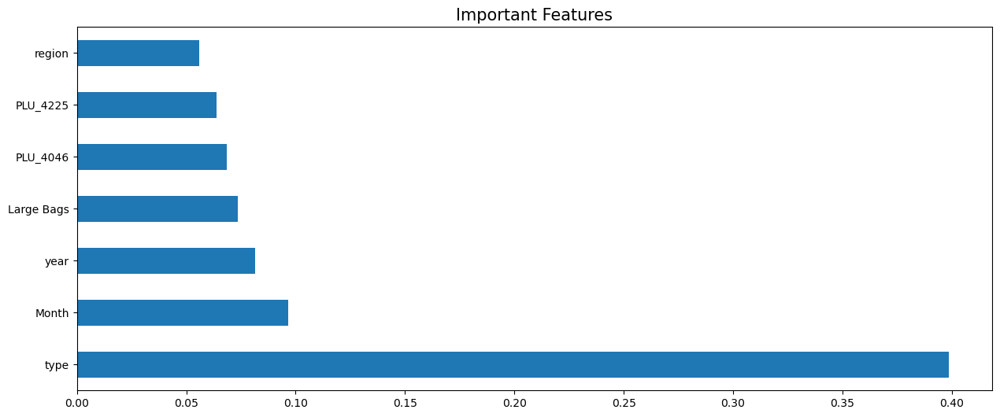

In [66]:
plt.figure(figsize=(15,6))
plt.title('Important Features',fontsize=15)
feat_importance=pd.Series(extra.feature_importances_,index=X.columns)
feat_importance.nlargest(7).plot(kind='barh')
plt.show()

These are the best features selected for the model

In [67]:
X=X.drop(columns=['Total Bags','Total Volume','PLU_4770','Small Bags','XLarge Bags'],axis=1)

In [69]:
X

,PLU_4046,PLU_4225,Large Bags,type,year,region,Month
0,10.854923,27.255911,6.525171,0,2015,0,12
1,9.888009,26.267783,6.613953,0,2015,0,12
2,10.251442,30.951290,6.727303,0,2015,0,12
3,11.058736,28.692818,7.263081,0,2015,0,12
4,10.633915,26.179273,8.109045,0,2015,0,11
...,...,...,...,...,...,...,...
18244,12.489874,13.266908,9.959339,1,2018,53,2
18245,11.178901,15.816355,9.259228,1,2018,53,1
18246,11.179334,14.719994,5.043317,1,2018,53,1
18247,11.770121,15.350200,5.341817,1,2018,53,1


In [70]:
def Best_model(pipe,X,y):
    Maximum_R2_score=0
    for random_state in range(42,100):
        X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.20,random_state=random_state)
        pipe.fit(X_train,y_train)
        y_pred=pipe.predict(X_test)
        R2_score=r2_score(y_test,y_pred)
        if R2_score>Maximum_R2_score:
            Maximum_R2_score=R2_score
            final_random_state=random_state
    print(f'At random state :-- {final_random_state}')
    print('Maximum r2 score is',  round(Maximum_R2_score ,4))
    print('cross validation score',round(cross_val_score(pipe,X,y,scoring='r2',cv=10).mean(),2))
    print('Standard Deviation',round(cross_val_score(pipe,X,y,scoring='r2',cv=10).std(),2))
    print('Training accuracy',round(pipe.score(X_train,y_train),2))
    print('Test Accuracy',round(pipe.score(X_test,y_test),2))
    print('MAE',round(mean_absolute_error(y_test,y_pred),2))
    print('MSE',round(mean_squared_error(y_test,y_pred),2))
    print('RMSE',round(np.sqrt(mean_squared_error(y_test,y_pred)),2))

# LinearRegression

In [71]:
step1 = step1 = ColumnTransformer(transformers=[
    ('Scaler',StandardScaler(),slice(0,X.shape[1]+1))
],remainder='passthrough')


step2=LinearRegression()

pipe = Pipeline([
    ('step1',step1),
    ('step2',step2),
])
Best_model(pipe,X,y)

At random state :-- 62
Maximum r2 score is 0.5393
cross validation score 0.05
Standard Deviation 0.17
Training accuracy 0.52
Test Accuracy 0.51
MAE 0.15
MSE 0.04
RMSE 0.19


# Ridge

In [72]:
step1 = step1 = ColumnTransformer(transformers=[
    ('Scaler',StandardScaler(),slice(0,X.shape[1]+1))
],remainder='passthrough')


step2=Ridge(random_state=0)

pipe = Pipeline([
    ('step1',step1),
    ('step2',step2)
])
Best_model(pipe,X,y)

At random state :-- 62
Maximum r2 score is 0.5393
cross validation score 0.05
Standard Deviation 0.17
Training accuracy 0.52
Test Accuracy 0.51
MAE 0.15
MSE 0.04
RMSE 0.19


# KNeighborsRegressor

In [74]:
step1 = step1 = ColumnTransformer(transformers=[
    ('Scaler',StandardScaler(),slice(0,X.shape[1]+1))
],remainder='passthrough')
step2=KNeighborsRegressor()

pipe = Pipeline([
    ('step1',step1),
    ('step2',step2)
])
Best_model(pipe,X,y)

At random state :-- 94
Maximum r2 score is 0.8711
cross validation score -0.07
Standard Deviation 0.23
Training accuracy 0.92
Test Accuracy 0.86
MAE 0.07
MSE 0.01
RMSE 0.1


# DecisionTreeRegressor

In [75]:
step1 = step1 = ColumnTransformer(transformers=[
    ('Scaler',StandardScaler(),slice(0,X.shape[1]+1))
],remainder='passthrough')


step2=DecisionTreeRegressor()

pipe = Pipeline([
    ('step1',step1),
    ('step2',step2)
])
Best_model(pipe,X,y)

At random state :-- 60
Maximum r2 score is 0.7886
cross validation score -0.19
Standard Deviation 0.3
Training accuracy 1.0
Test Accuracy 0.76
MAE 0.09
MSE 0.02
RMSE 0.13


# Voting regressor with same Algorithm but different parameters

In [77]:
step1 = step1 = ColumnTransformer(transformers=[
    ('Scaler',StandardScaler(),slice(0,X.shape[1]+1))
],remainder='passthrough')

knn1=KNeighborsRegressor(n_neighbors=3)
knn2=KNeighborsRegressor(n_neighbors=5)
knn3=KNeighborsRegressor(n_neighbors=7)
knn4=KNeighborsRegressor(n_neighbors=9)

estimators =[('knn1',knn1),
            ('knn2',knn2),
            ('knn3',knn3),
             ('knn4',knn4)
           ]

step2=VotingRegressor(estimators=estimators)

pipe = Pipeline([
    ('step1',step1),
    ('step2',step2)
])
Best_model(pipe,X,y)

At random state :-- 94
Maximum r2 score is 0.8761
cross validation score -0.03
Standard Deviation 0.22
Training accuracy 0.92
Test Accuracy 0.86
MAE 0.07
MSE 0.01
RMSE 0.1


# VotingRegressor with Decission tree & KNeighborsRegressor

In [96]:
step1 = step1 = ColumnTransformer(transformers=[
    ('Scaler',StandardScaler(),slice(0,X.shape[1]+1))
],remainder='passthrough')

knn1=KNeighborsRegressor()
Dt = DecisionTreeRegressor()


estimators =[('knn1',knn1),
            ('Dt',Dt),
           ]

step2=VotingRegressor(estimators=estimators)

pipe = Pipeline([
    ('step1',step1),
    ('step2',step2)
])
Best_model(pipe,X,y)

At random state :-- 95
Maximum r2 score is 0.8727
cross validation score 0.13
Standard Deviation 0.17
Training accuracy 0.98
Test Accuracy 0.86
MAE 0.07
MSE 0.01
RMSE 0.1


# Selecting best model as  VotingRegressor with Decission tree & KNeighborsRegressor

In [98]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.20,random_state=95)
step1 = step1 = ColumnTransformer(transformers=[
    ('Scaler',StandardScaler(),slice(0,X.shape[1]+1))
],remainder='passthrough')

knn1=KNeighborsRegressor()
Dt = DecisionTreeRegressor()


estimators =[('knn1',knn1),
            ('Dt',Dt),
           ]

step2=VotingRegressor(estimators=estimators)

pipe = Pipeline([
    ('step1',step1),
    ('step2',step2)
])
pipe.fit(X_train,y_train)
y_pred = pipe.predict(X_test)
print('Training accuracyfor  training datais :', pipe.score(X_train,y_train)*100)
print('Testing accuracy for testing data is: ', pipe.score(X_test,y_test)*100)
print("R2 score is: ",r2_score(y_test,y_pred)*100)
print('MAE',mean_absolute_error(y_test,y_pred))
print('MSE',mean_squared_error(y_test,y_pred))
print('RMSE',np.sqrt(mean_absolute_error(y_test,y_pred)))

Training accuracyfor  training datais : 97.68045295151266
Testing accuracy for testing data is:  87.4477813030456
R2 score is:  87.4477813030456
MAE 0.0684945626770442
MSE 0.009221578465633524
RMSE 0.2617146588883477


# Hyperparameter tuning

In [99]:
params={
    "step2__knn1__n_neighbors":np.arange(1,20,2),
        "step2__knn1__weights":["uniform", "distance"],
        "step2__knn1__algorithm":["auto", "ball_tree", "kd_tree", "brute"],
        "step2__knn1__leaf_size":np.arange(1,50),  
        "step2__Dt__criterion":["mse", "friedman_mse", "mae"],
        "step2__Dt__splitter":["best", "random"],
        "step2__Dt__max_depth":np.arange(1,50),
        "step2__Dt__min_samples_split":np.arange(1,10),
        "step2__Dt__max_features":["auto", "sqrt", "log2"],
        "step2__Dt__ccp_alpha":[0.0,0.1,0.2,0.3,0.4,0.5],
        "step2__weights":[[1,2],[2,1],[1,3],[3,1],[2,3],[3,1],[1,1]]
}

In [100]:
randomscv = RandomizedSearchCV(pipe , params,scoring='r2',n_jobs=-1,cv=10,random_state=42)

In [101]:
randomscv.fit(X,y)

RandomizedSearchCV(cv=10,
                   estimator=Pipeline(steps=[('step1',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('Scaler',
                                                                               StandardScaler(),
                                                                               slice(0, 8, None))])),
                                             ('step2',
                                              VotingRegressor(estimators=[('knn1',
                                                                           KNeighborsRegressor()),
                                                                          ('Dt',
                                                                           DecisionTreeRegressor())]))]),
                   n_jobs=-1,
                   param_distributions={'step2__Dt__ccp_alpha': [0.0, 0.1, 0.2,
        

In [103]:
randomscv.best_params_

{'step2__weights': [3, 1],
 'step2__knn1__weights': 'distance',
 'step2__knn1__n_neighbors': 19,
 'step2__knn1__leaf_size': 38,
 'step2__knn1__algorithm': 'auto',
 'step2__Dt__splitter': 'random',
 'step2__Dt__min_samples_split': 2,
 'step2__Dt__max_features': 'log2',
 'step2__Dt__max_depth': 36,
 'step2__Dt__criterion': 'mae',
 'step2__Dt__ccp_alpha': 0.1}

In [118]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.20,random_state=95)
step1 = step1 = ColumnTransformer(transformers=[
    ('Scaler',StandardScaler(),slice(0,X.shape[1]+1))
],remainder='passthrough')


knn1=KNeighborsRegressor(weights="distance",n_neighbors=19,leaf_size=38,algorithm="auto")


Dt = DecisionTreeRegressor(splitter='random',min_samples_split=2,max_features="log2",max_depth=36,criterion="mae")


estimators =[('knn1',knn1),
            ('Dt',Dt),
           ]

step2=VotingRegressor(estimators=estimators,weights=[3,1])

pipe = Pipeline([
    ('step1',step1),
    ('step2',step2)
])
pipe.fit(X_train,y_train)
pipe.fit(X_train,y_train)
y_pred = pipe.predict(X_test)
print('Training accuracyfor  training datais :', pipe.score(X_train,y_train)*100)
print('Testing accuracy for testing data is: ', pipe.score(X_test,y_test)*100)
print("R2 score is: ",r2_score(y_test,y_pred)*100)
print('MAE',mean_absolute_error(y_test,y_pred))
print('MSE',mean_squared_error(y_test,y_pred))
print('RMSE',np.sqrt(mean_absolute_error(y_test,y_pred)))

Training accuracyfor  training datais : 99.7842186635712
Testing accuracy for testing data is:  85.21281905682119
R2 score is:  85.21281905682119
MAE 0.07663115423279153
MSE 0.0108635096826452
RMSE 0.27682332674973675


# Saving model

In [119]:
pickle.dump(pipe,open('Avacado_Reg.pkl','wb'))

# Prediction

In [120]:
original_values  = np.array(y_test)
predicted_values = np.array(pipe.predict(X_test))
values = pd.DataFrame({'Original_values':original_values , 'predicted_values':predicted_values})

In [122]:
values['Error'] =round(values['Original_values'] - values['predicted_values'],2)

In [123]:
values

,Original_values,predicted_values,Error
0,0.222940,0.162853,0.06
1,0.443878,0.553647,-0.11
2,0.148330,0.149130,-0.00
3,0.481476,0.472446,0.01
4,0.660896,0.595383,0.07
...,...,...,...
3645,0.450245,0.442803,0.01
3646,0.475308,0.515874,-0.04
3647,0.029555,0.029156,0.00
3648,0.029555,0.047168,-0.02


# For classification problem

In [250]:
df

,Week_No,AveragePrice,Total Volume,PLU_4046,PLU_4225,PLU_4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month
0,0,0.292320,19.365417,10.854923,27.255911,4.462905,22.068562,25.152672,6.525171,-7.881551,1,2015,0,12
1,1,0.307098,18.927224,9.888009,26.267783,4.717145,22.501622,25.689411,6.613953,-7.881551,1,2015,0,12
2,2,-0.061891,21.124652,10.251442,30.951290,5.824614,21.753715,24.753683,6.727303,-7.881551,1,2015,0,12
3,3,0.086147,19.950620,11.058736,28.692818,5.011479,20.186624,22.776974,7.263081,-7.881551,1,2015,0,12
4,4,0.254377,18.727662,10.633915,26.179273,5.070123,20.468323,23.069022,8.109045,-7.881551,1,2015,0,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,7,0.493697,15.871484,12.489874,13.266908,-3.925458,24.276531,27.745219,9.959339,-7.881551,1,2018,53,2
18245,8,0.541124,15.364541,11.178901,15.816355,-3.925458,22.376003,25.381842,9.259228,-7.881551,1,2018,53,1
18246,9,0.629645,15.343232,11.179334,14.719994,8.412596,22.443793,25.653092,5.043317,-7.881551,1,2018,53,1
18247,10,0.660896,15.742285,11.770121,15.350200,8.410551,23.213528,26.605308,5.341817,-7.881551,1,2018,53,1


In [251]:
df.region.value_counts()

47    338
31    338
6     338
37    338
21    338
5     338
52    338
36    338
20    338
4     338
51    338
35    338
19    338
3     338
50    338
34    338
18    338
2     338
49    338
33    338
17    338
1     338
48    338
32    338
16    338
22    338
38    338
7     338
27    338
15    338
46    338
30    338
14    338
45    338
29    338
13    338
44    338
28    338
12    338
43    338
11    338
23    338
42    338
26    338
10    338
41    338
25    338
9     338
40    338
24    338
8     338
39    338
0     338
53    335
Name: region, dtype: int64

There is no imbalance in our data because all the classes are equally distributed

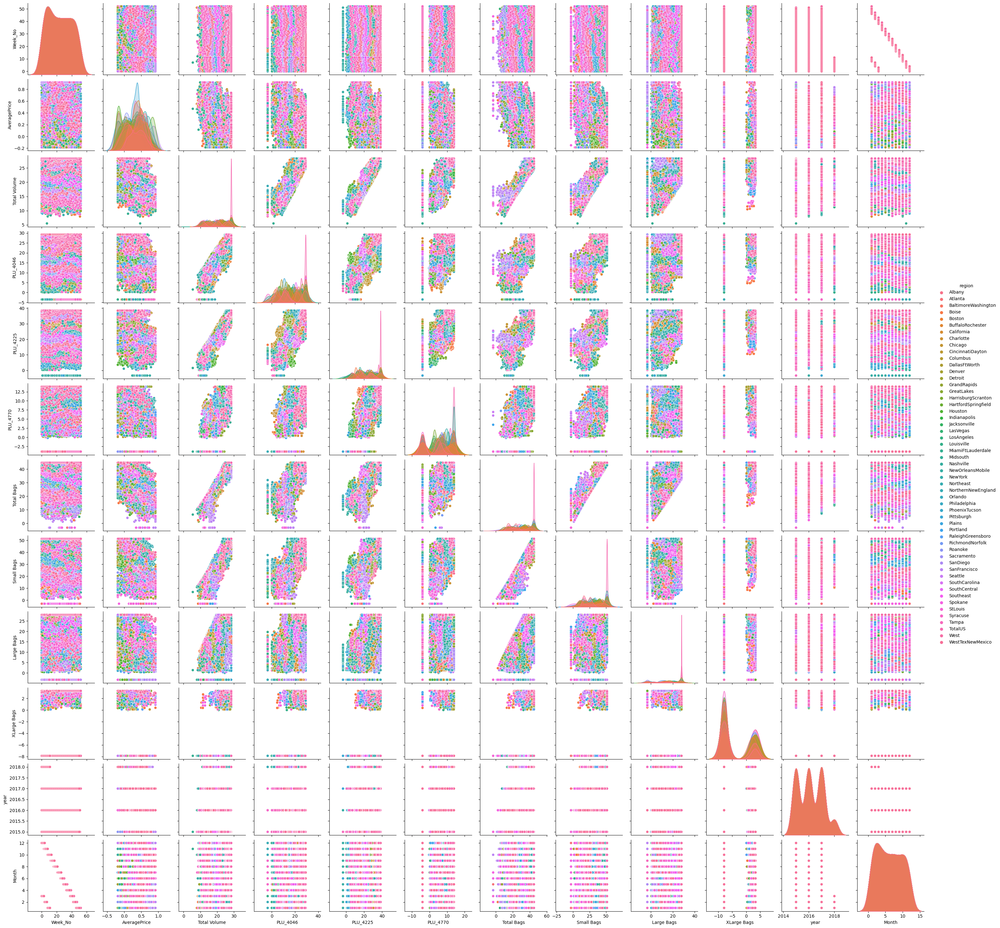

In [128]:
sns.pairplot(df,hue='region')

From the above pair plot  we can clearly observer that points are overlapped to each other hence linear kind of algorithm will not suitable to create model 

# Label Encoding the output column

In [252]:
le=LabelEncoder()
df['region']=le.fit_transform(df['region'])

In [253]:
df['type']=np.where(df['type']=="conventional",0,1)

In [254]:
df

,Week_No,AveragePrice,Total Volume,PLU_4046,PLU_4225,PLU_4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month
0,0,0.292320,19.365417,10.854923,27.255911,4.462905,22.068562,25.152672,6.525171,-7.881551,1,2015,0,12
1,1,0.307098,18.927224,9.888009,26.267783,4.717145,22.501622,25.689411,6.613953,-7.881551,1,2015,0,12
2,2,-0.061891,21.124652,10.251442,30.951290,5.824614,21.753715,24.753683,6.727303,-7.881551,1,2015,0,12
3,3,0.086147,19.950620,11.058736,28.692818,5.011479,20.186624,22.776974,7.263081,-7.881551,1,2015,0,12
4,4,0.254377,18.727662,10.633915,26.179273,5.070123,20.468323,23.069022,8.109045,-7.881551,1,2015,0,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,7,0.493697,15.871484,12.489874,13.266908,-3.925458,24.276531,27.745219,9.959339,-7.881551,1,2018,53,2
18245,8,0.541124,15.364541,11.178901,15.816355,-3.925458,22.376003,25.381842,9.259228,-7.881551,1,2018,53,1
18246,9,0.629645,15.343232,11.179334,14.719994,8.412596,22.443793,25.653092,5.043317,-7.881551,1,2018,53,1
18247,10,0.660896,15.742285,11.770121,15.350200,8.410551,23.213528,26.605308,5.341817,-7.881551,1,2018,53,1


# Splitting Data into imput label & output label

In [255]:
X = df.drop(columns=['region','Week_No'],axis=1)

In [256]:
X

,AveragePrice,Total Volume,PLU_4046,PLU_4225,PLU_4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,Month
0,0.292320,19.365417,10.854923,27.255911,4.462905,22.068562,25.152672,6.525171,-7.881551,1,2015,12
1,0.307098,18.927224,9.888009,26.267783,4.717145,22.501622,25.689411,6.613953,-7.881551,1,2015,12
2,-0.061891,21.124652,10.251442,30.951290,5.824614,21.753715,24.753683,6.727303,-7.881551,1,2015,12
3,0.086147,19.950620,11.058736,28.692818,5.011479,20.186624,22.776974,7.263081,-7.881551,1,2015,12
4,0.254377,18.727662,10.633915,26.179273,5.070123,20.468323,23.069022,8.109045,-7.881551,1,2015,11
...,...,...,...,...,...,...,...,...,...,...,...,...
18244,0.493697,15.871484,12.489874,13.266908,-3.925458,24.276531,27.745219,9.959339,-7.881551,1,2018,2
18245,0.541124,15.364541,11.178901,15.816355,-3.925458,22.376003,25.381842,9.259228,-7.881551,1,2018,1
18246,0.629645,15.343232,11.179334,14.719994,8.412596,22.443793,25.653092,5.043317,-7.881551,1,2018,1
18247,0.660896,15.742285,11.770121,15.350200,8.410551,23.213528,26.605308,5.341817,-7.881551,1,2018,1


In [257]:
y = df['region']

In [258]:
y

0         0
1         0
2         0
3         0
4         0
         ..
18244    53
18245    53
18246    53
18247    53
18248    53
Name: region, Length: 18249, dtype: int64

# Feature Importance

In [259]:
from sklearn.ensemble import ExtraTreesClassifier
extra=ExtraTreesClassifier()
extra.fit(X,y)

ExtraTreesClassifier()

In [260]:

print(extra.feature_importances_)

[0.10096455 0.1021704  0.14645951 0.14040719 0.10126941 0.07610392
 0.08705059 0.09513399 0.03043835 0.         0.06322814 0.05677397]


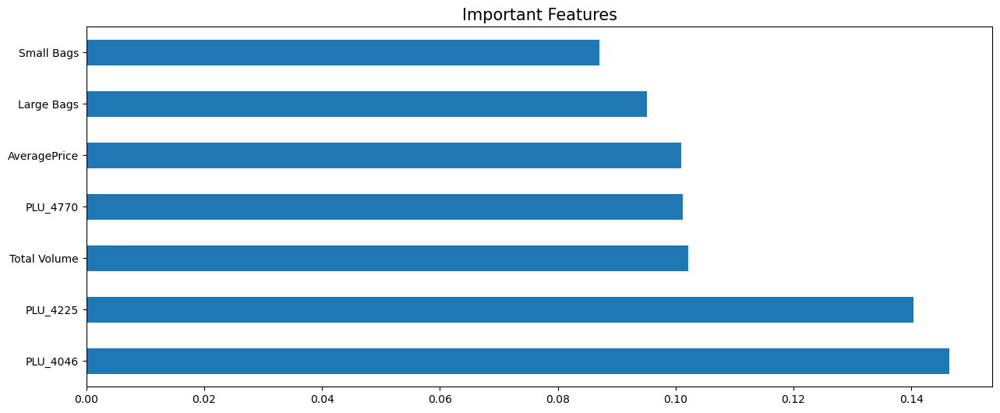

In [261]:

plt.figure(figsize=(15,6))
plt.title('Important Features',fontsize=15)
feat_importance=pd.Series(extra.feature_importances_,index=X.columns)
feat_importance.nlargest(7).plot(kind='barh')
plt.show()


In [264]:
X = X[['Small Bags',"Large Bags","AveragePrice",'PLU_4770',"Total Volume","PLU_4225","PLU_4046"]]

In [265]:
X

,Small Bags,Large Bags,AveragePrice,PLU_4770,Total Volume,PLU_4225,PLU_4046
0,25.152672,6.525171,0.292320,4.462905,19.365417,27.255911,10.854923
1,25.689411,6.613953,0.307098,4.717145,18.927224,26.267783,9.888009
2,24.753683,6.727303,-0.061891,5.824614,21.124652,30.951290,10.251442
3,22.776974,7.263081,0.086147,5.011479,19.950620,28.692818,11.058736
4,23.069022,8.109045,0.254377,5.070123,18.727662,26.179273,10.633915
...,...,...,...,...,...,...,...
18244,27.745219,9.959339,0.493697,-3.925458,15.871484,13.266908,12.489874
18245,25.381842,9.259228,0.541124,-3.925458,15.364541,15.816355,11.178901
18246,25.653092,5.043317,0.629645,8.412596,15.343232,14.719994,11.179334
18247,26.605308,5.341817,0.660896,8.410551,15.742285,15.350200,11.770121


In [266]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer,OneHotEncoder
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split,GridSearchCV,cross_val_score
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix,roc_auc_score

# Selecting best random state

In [295]:
def max_accuracy_score(pipe,X,y):
    max_accuracy=0
    for i in range(42,100):
        X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.20,random_state=i,stratify=y)
        pipe.fit(X_train,y_train)
        y_pred=pipe.predict(X_test)
        accuracy_check=accuracy_score(y_test,y_pred)
        if accuracy_check>max_accuracy:
            max_accuracy=accuracy_check
            final_r=i
    print('max Accuracy score corresponding to', final_r,'is' ,    round( max_accuracy ,2) *100)
    print('cross validation score',cross_val_score(pipe,X,y,scoring='accuracy').mean())
    print('Standard Deviation',cross_val_score(pipe,X,y,scoring='accuracy').std())
    print('Training accuracy',round( pipe.score(X_train,y_train),2)*100)
    print('Test Accuracy',round(pipe.score(X_test,y_test),2)*100)
    print('Confusion Matrix')
    print(confusion_matrix(y_test,y_pred))

# KNeighborsClassifier

In [296]:
step1 = step1 = ColumnTransformer(transformers=[
    ('Scaler',StandardScaler(),slice(0,X.shape[1]+1))
],remainder='passthrough')


step2=KNeighborsClassifier()

pipe = Pipeline([
    ('step1',step1),
    ('step2',step2)
])
max_accuracy_score(pipe,X,y)

max Accuracy score corresponding to 54 is 80.0
cross validation score 0.553172428550513
Standard Deviation 0.08169778086693615
Training accuracy 86.0
Test Accuracy 80.0
Confusion Matrix
[[59  0  0 ...  0  0  0]
 [ 0 47  0 ...  0  0  1]
 [ 0  0 66 ...  0  0  0]
 ...
 [ 0  0  0 ... 41 10  0]
 [ 0  0  0 ...  0 48  0]
 [ 0  0  1 ...  0  0 43]]


# Decission Tree

In [297]:
step1 = step1 = ColumnTransformer(transformers=[
    ('Scaler',StandardScaler(),slice(0,X.shape[1]+1))
],remainder='passthrough')


step2=DecisionTreeClassifier()

pipe = Pipeline([
    ('step1',step1),
    ('step2',step2)
])
max_accuracy_score(pipe,X,y)

max Accuracy score corresponding to 82 is 75.0
cross validation score 0.4995286529993205
Standard Deviation 0.07473882129213914
Training accuracy 97.0
Test Accuracy 74.0
Confusion Matrix
[[52  0  0 ...  0  0  0]
 [ 0 51  0 ...  0  0  0]
 [ 0  0 63 ...  0  0  1]
 ...
 [ 0  0  0 ... 42  7  0]
 [ 0  0  0 ...  6 41  0]
 [ 0  1  1 ...  0  0 43]]


# RandomForest

In [298]:
step1 = step1 = ColumnTransformer(transformers=[
    ('Scaler',StandardScaler(),slice(0,X.shape[1]+1))
],remainder='passthrough')


step2=RandomForestClassifier()

pipe = Pipeline([
    ('step1',step1),
    ('step2',step2)
])
max_accuracy_score(pipe,X,y)

max Accuracy score corresponding to 62 is 86.0
cross validation score 0.6129573949702865
Standard Deviation 0.08778992558672337
Training accuracy 97.0
Test Accuracy 85.0
Confusion Matrix
[[59  0  0 ...  0  0  0]
 [ 0 57  0 ...  0  0  0]
 [ 0  0 68 ...  0  0  0]
 ...
 [ 0  0  0 ... 42 12  0]
 [ 0  0  0 ...  6 49  0]
 [ 0  0  1 ...  0  0 53]]


# Selecting Random forest as best model

In [302]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.20,random_state=62,stratify=y)

step1 = step1 = ColumnTransformer(transformers=[
    ('Scaler',StandardScaler(),slice(0,X.shape[1]+1))
],remainder='passthrough')


step2=RandomForestClassifier()

pipe = Pipeline([
    ('step1',step1),
    ('step2',step2)
])


In [303]:
pipe.fit(X_train,y_train)
y_pred = pipe.predict(X_test)
y_train_pred = (pipe.predict(X_train))
print('max Accuracy score corresponding to is ' ,  round( accuracy_score(y_test,y_pred),2) *100)
print('cross validation score',cross_val_score(pipe,X,y,scoring='accuracy').mean())
print('Standard Deviation',cross_val_score(pipe,X,y,scoring='accuracy').std())
print('Training accuracy',round( pipe.score(X_train,y_train),2)*100)
print('Test Accuracy',round(pipe.score(X_test,y_test),2)*100)
print('Confusion Matrix')
print(confusion_matrix(y_test,y_pred))

max Accuracy score corresponding to is  85.0
cross validation score 0.6140529249897702
Standard Deviation 0.0890754689283544
Training accuracy 97.0
Test Accuracy 85.0
Confusion Matrix
[[58  0  0 ...  0  0  0]
 [ 0 58  0 ...  0  0  0]
 [ 0  0 62 ...  0  0  0]
 ...
 [ 0  0  0 ... 45  5  0]
 [ 0  0  0 ...  6 46  0]
 [ 0  0  0 ...  0  0 58]]


# Hyperparameter tuning for Random forest

In [318]:
params ={
    
    
    "step2__criterion":["gini", "entropy"],
    "step2__max_depth":np.arange(1,100),
    "step2__min_samples_split":np.arange(0,50),
    "step2__max_features":["auto", "sqrt", "log2"],
    "step2__bootstrap":["True","False"],
    "step2__ccp_alpha":[0.0,0.1,0.01,0.5]
}


In [319]:
randomscv = RandomizedSearchCV(pipe , params,scoring='accuracy',n_jobs=-1,cv=10,random_state=42)

In [320]:
randomscv.fit(X,y)

RandomizedSearchCV(cv=10,
                   estimator=Pipeline(steps=[('step1',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('Scaler',
                                                                               StandardScaler(),
                                                                               slice(0, 8, None))])),
                                             ('step2',
                                              RandomForestClassifier(bootstrap='False',
                                                                     max_depth=23,
                                                                     max_features=2,
                                                                     min_samples_split=23,
                                                                     random_state=95))]),
                   n_jobs=-1,
                   p

In [321]:
randomscv.best_params_

{'step2__min_samples_split': 8,
 'step2__max_features': 'auto',
 'step2__max_depth': 22,
 'step2__criterion': 'gini',
 'step2__ccp_alpha': 0.0,
 'step2__bootstrap': 'False'}

In [324]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.20,random_state=62,stratify=y)

step1 = step1 = ColumnTransformer(transformers=[
    ('Scaler',StandardScaler(),slice(0,X.shape[1]+1))
],remainder='passthrough')


step2=RandomForestClassifier(criterion="gini",max_depth=22,max_features="auto",min_samples_split=8,bootstrap='False',ccp_alpha=0.0)

pipe = Pipeline([
    ('step1',step1),
    ('step2',step2)
])


In [325]:
pipe.fit(X_train,y_train)
y_pred = pipe.predict(X_test)
y_train_pred = (pipe.predict(X_train))
print('Accuracy score  is ' ,  round( accuracy_score(y_test,y_pred),2) *100)
print('cross validation score',cross_val_score(pipe,X,y,scoring='accuracy').mean())
print('Standard Deviation',cross_val_score(pipe,X,y,scoring='accuracy').std())
print('Training accuracy',round( pipe.score(X_train,y_train),2)*100)
print('Test Accuracy',round(pipe.score(X_test,y_test),2)*100)
print('Confusion Matrix')
print(confusion_matrix(y_test,y_pred))

Accuracy score  is  84.0
cross validation score 0.6086827466335307
Standard Deviation 0.09239841611595724
Training accuracy 95.0
Test Accuracy 84.0
Confusion Matrix
[[60  0  0 ...  0  0  0]
 [ 0 55  0 ...  0  0  0]
 [ 0  0 61 ...  0  0  0]
 ...
 [ 0  0  0 ... 45  4  0]
 [ 0  0  0 ...  5 46  0]
 [ 0  0  0 ...  0  0 51]]


# Saving the model

In [326]:
pickle.dump(pipe,open('Avacado_class.pkl','wb'))

# Prediction

In [328]:
original_values  = np.array(y_test)
predicted_values = np.array(pipe.predict(X_test))
values = pd.DataFrame({'Original_values':original_values , 'predicted_values':predicted_values})
values

,Original_values,predicted_values
0,36,36
1,32,32
2,35,35
3,15,25
4,0,0
...,...,...
3645,41,41
3646,36,36
3647,24,50
3648,27,27
